# Pre-processing for the DLMI Kaggle challenge

Importing all the necessary packages

In [ ]:
import time
import os
import skimage.io
import numpy as np
import pandas as pd
import cv2
import PIL.Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SubsetRandomSampler, RandomSampler, SequentialSampler
import albumentations as A
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
from sklearn.metrics import cohen_kappa_score
from tqdm import tqdm
import torchvision
from astropy.nddata import block_reduce
import os
import cv2
import skimage.io
from tqdm.notebook import tqdm
import zipfile
import numpy as np

In [ ]:
TRAIN = '/content/drive/MyDrive/DLMI/train/train'
TEST = "/content/drive/MyDrive/DLMI/test/test"
Output_Train = '/content/drive/MyDrive/DLMI/train_128x128x64'
patch_size = 128 
N = 64  #number of tiles to produce per image

# Creating directory
os.makedirs(Output_Train, exist_ok=True)

def make_tiles(img,patch_size,N):
    # Results to add the patches 
    patches_L = []
    pad_0,pad_1 = (patch_size - img.shape[0]%patch_size)%patch_size, (patch_size - img.shape[1]%patch_size)%patch_size
    # Apply padding to the image so that we made sure that we can devide it into patch_size x patch_size
    img = np.pad(img,[[pad_0//2,pad_0-pad_0//2],[pad_1//2,pad_1-pad_1//2],[0,0]],constant_values=255)
    # Image reshape
    img = img.reshape(img.shape[0]//patch_size,patch_size,img.shape[1]//patch_size,patch_size,3)
    img = img.transpose(0,2,1,3,4).reshape(-1,patch_size,patch_size,3)
    # if we have less than the number of tiles , we pad the image more !
    if len(img) < N:
        img = np.pad(img,[[0,N-len(img)],[0,0],[0,0],[0,0]],constant_values=255)
    # Sorting the image according to the pixel values     
    patches = np.argsort(img.reshape(img.shape[0],-1).sum(-1))[:N]
    img = img[patches]
    for i in range(len(img)):
        patches_L.append({'img':img[i], 'idx':i})
    return patches_L

In [ ]:
# Generate tiles
# Just verification process because it takes too long to generate (we did the pre processing on more than one time)
file_names = os.listdir(Output_Train)
# Creating a dictionary to check if we have the required number of
is_complete = {}
for name in file_names:
    img_n = name.split('_')[0]
    if img_n in is_complete:
        is_complete[img_n] += 1
    else: 
      is_complete[img_n] = 1

#deleting the extension.
names = [name[:-5] for name in os.listdir(TRAIN)]

def saving_tiles(name):
    if (name in is_complete and is_complete[name] == N) or name =="c":#2*N:
        return 0
    print(name)
    img = skimage.io.MultiImage(os.path.join(TRAIN,name+'.tiff'))[0]
    patches = make_tiles(img)
    for patch in patches:
        img,idx = patch['img'],patch['idx']
        cv2.imwrite(os.path.join(Output_Train,f'{name}_{idx}.png'),cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

for name in tqdm(names) : 
  saving_tiles(name)
  
names = [name[:-5] for name in os.listdir(TRAIN)]

We now plot some patch examples.

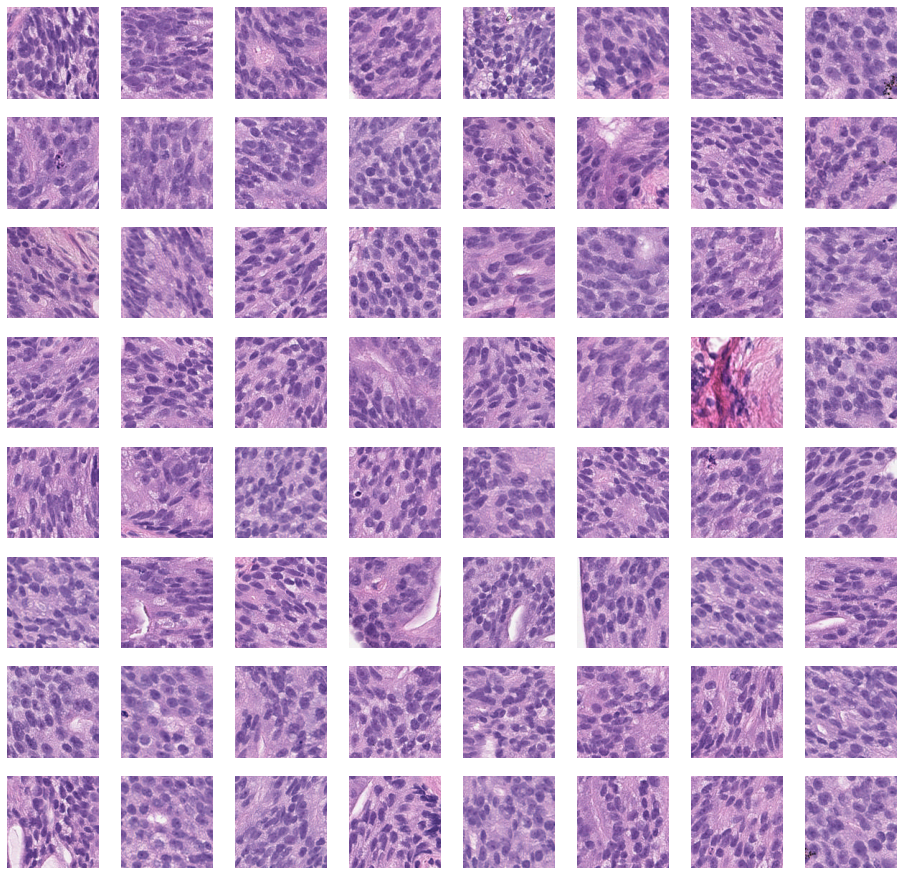

In [ ]:
#img = cv2.cvtColor(cv2.imread(os.path.join(Output_Train,names[0]+'_'+str(i)+'.png')), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16,32))
for i in range(64):
    img = cv2.cvtColor(cv2.imread(os.path.join(Output_Train,names[0]+'_'+str(i)+'.png')), cv2.COLOR_BGR2RGB)
    plt.subplot(16,8,i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.subplots_adjust(wspace=None, hspace=None)

For the models that we have tested, we used two approaches:

- We tried gluing all this images to form a $ (128 \times 6) \times (128 \times 6) $ = $768 \times 768 $ images out of the generated tiles so that we can feed them afterwards to our model to train. 

- Training directly on those tiles (MIL approach) that we will explore in the other notebook, which didn't yield to good results. 

**NOTE** : we did both this operations on the test and the train datasets.

In [ ]:
save_dir = "data/train_tiles/"
data_dir = '/content/drive/MyDrive/DLMI/'
df_train = pd.read_csv(os.path.join(data_dir, 'train.csv'))
number_of_tiles = 36
image_size = 128
print(df_train.head())

df_test = pd.read_csv(os.path.join(data_dir, 'test.csv'))
print(df_train.head())

image_folder = os.path.join('/content/drive/MyDrive/DLMI/', 'train/train')

                           image_id data_provider  isup_grade gleason_score
0  995df9b93db1e396b57692c6c7f1d673       radboud           0      negative
1  86d4621be3deca4f8d461e3abce7d585       radboud           4           4+4
2  e2578d331ae6cb3bc649027498c8ff8d       radboud           1           3+3
3  c65fcde885b4f231d03cefb0fc75f4fa       radboud           4           4+4
4  c4bbe05f5d77f1a42bc95191285ab1bb       radboud           3           4+3
                           image_id data_provider  isup_grade gleason_score
0  995df9b93db1e396b57692c6c7f1d673       radboud           0      negative
1  86d4621be3deca4f8d461e3abce7d585       radboud           4           4+4
2  e2578d331ae6cb3bc649027498c8ff8d       radboud           1           3+3
3  c65fcde885b4f231d03cefb0fc75f4fa       radboud           4           4+4
4  c4bbe05f5d77f1a42bc95191285ab1bb       radboud           3           4+3


In [ ]:
def covert_tiles():
    # select the number of data samples here

    for i in tqdm(range(len(image_folder))):

        row = df_train.iloc[i]
        img_id = row.image_id
        save_path = save_dir + img_id + '.png'
        idxes = list(range(number_of_tiles))
        n_row_tiles = int(np.sqrt(number_of_tiles))
        # initialization of the image
        images = np.zeros((image_size * n_row_tiles, image_size * n_row_tiles, 3))
        # concatinating the images
        for h in range(n_row_tiles):
            for w in range(n_row_tiles):
                i = h * n_row_tiles + w
                img = cv2.cvtColor(cv2.imread(os.path.join(Output_Train,names[0]+'_'+str(i)+'.png')), cv2.COLOR_BGR2RGB)
                h1 = h * image_size
                w1 = w * image_size
                images[h1:h1+image_size, w1:w1+image_size] = img # Storing the image in the adequate position
        images = images.astype(np.float32) # Convert the image to float32 to fit in the memroy
        print("saving image", i)
        cv2.imwrite(save_path, images)

In [ ]:
'''covert_tiles()'''

Mounted at /content/drive


After creating those tiles, here are what the images look like:

- Training set:

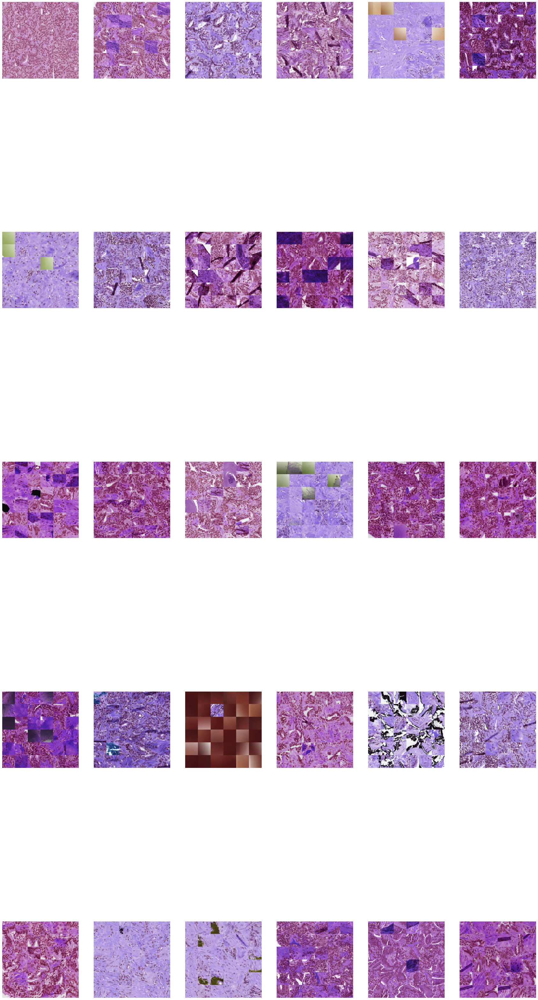

In [ ]:
Glued_images = "/content/drive/MyDrive/DLMI/train_128_36"
plt.figure(figsize=(30,64))

for i in range(30):
    img = cv2.cvtColor(cv2.imread(os.path.join(Glued_images,names[i]+'.png')), cv2.COLOR_BGR2RGB)
    plt.subplot(5,6,i+1)
    plt.imshow(img)
    plt.axis('off')

- Testing set

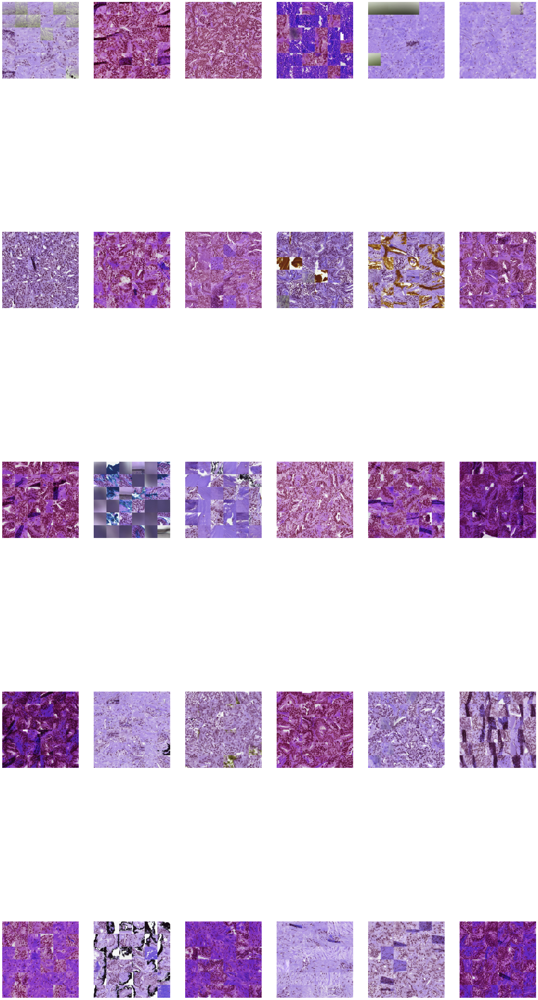

In [ ]:
names = [name[:-5] for name in os.listdir(TEST)]
Glued_images = "/content/drive/MyDrive/DLMI/test_128_36"
plt.figure(figsize=(30,64))

for i in range(30):
    img = cv2.cvtColor(cv2.imread(os.path.join(Glued_images,names[i]+'.png')), cv2.COLOR_BGR2RGB)
    plt.subplot(5,6,i+1)
    plt.imshow(img)
    plt.axis('off')

As we can see, adopting this strategy is not optimal, many images present strange paterns that will likely bias our model. For that reason, we decided to adapt new strategy aiming at building a stronger model.

Before exploring those approaches, we decided to delete the images that present those greenish colors. For that reason, we decided to implement a function that marks the images that present an insufficient number of purple patches.

In [ ]:
#Utils for patches

def is_purple(crop: np.ndarray, purple_threshold: int,
              purple_scale_size: int) -> bool:
    block_size = (crop.shape[0] // purple_scale_size,
                  crop.shape[1] // purple_scale_size, 1)
    pooled = block_reduce(data=crop, block_size=block_size, func=np.average)

    # Calculate boolean arrays for determining if portion is purple.
    r, g, b = pooled[..., 0], pooled[..., 1], pooled[..., 2]
    cond1 = r > g - 10
    cond2 = b > g - 10
    cond3 = ((r + b) / 2) > g + 20

    # Find the indexes of pooled satisfying all 3 conditions.
    pooled = pooled[cond1 & cond2 & cond3]
    num_purple = pooled.shape[0]
    return num_purple > purple_threshold

In [ ]:
image_path = '/content/drive/MyDrive/DLMI/train_128_36'
ToReconstruct_L = []
for img_name in os.listdir(image_path) :
  image = cv2.cvtColor(cv2.imread(os.path.join(image_path,img_name)), cv2.COLOR_BGR2RGB)
  if is_purple(image,24,6)==False :
    ToReconstruct_L.append(img_name)

The bad images look like the following:

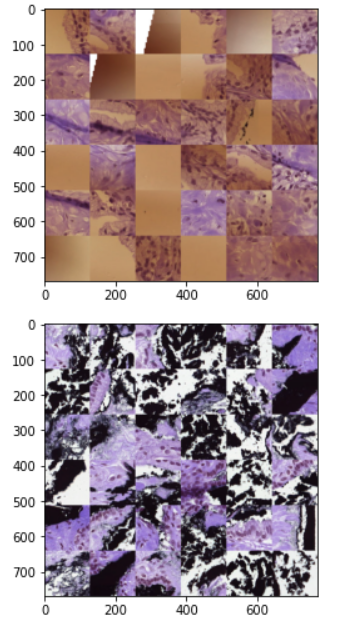

At first, we chose to delete them, but since we the data is scarce, we decided to adapt the purple patches approach to form the new patches.

Now we will generate purple tiles, the ones that we are going to use to train our final model.

In [ ]:
def is_purple(crop: np.ndarray, purple_threshold: int,
              purple_scale_size: int) -> bool:
    block_size = (crop.shape[0] // purple_scale_size,
                  crop.shape[1] // purple_scale_size, 1)
    pooled = block_reduce(data=crop, block_size=block_size, func=np.average)

    # Calculate boolean arrays for determining if portion is purple.
    r, g, b = pooled[..., 0], pooled[..., 1], pooled[..., 2]
    cond1 = r > g - 10
    cond2 = b > g - 10
    cond3 = ((r + b) / 2) > g + 20

    # Find the indexes of pooled satisfying all 3 conditions.
    pooled = pooled[cond1 & cond2 & cond3]
    num_purple = pooled.shape[0]
    return (num_purple > purple_threshold,num_purple)
#
def Green_blue_concentration(image):
    width, height = image.shape[0], image.shape[1]
    green_concentration = np.mean(image[1])
    blue_concentration = np.mean(image[2])
    return green_concentration, blue_concentration

#Getting the coordinates of the best region.    
def best_regions_cordinates(regions, k=20):
    regions = [x for x in regions if (x[3] > 180 and x[4] > 180)] # Filtering with the green and blue pixel values
    k_best_regions = sorted(regions, key=lambda tup: tup[2])[-k:] # selecting the regions based on the purple values
    return k_best_regions
#Getting the regions from the coordinates.
def best_regions(coordinates, image, window_size=512):
    regions = {}
    for i, tup in enumerate(coordinates):
        x, y = tup[0], tup[1]
        regions[i] = image[x : x+window_size, y : y+window_size, :]
    
    return regions
#Generating the patches to form the image final image    
def generate_patches(slide_path, window_size=200, stride=128, k=20):
    image = skimage.io.MultiImage(slide_path)[-1]
    image = np.array(image)
    
    max_width, max_height = image.shape[0], image.shape[1]
    regions_container = []
    i = 0
    while window_size + stride*i <= max_height:
        j = 0
        while window_size + stride*j <= max_width:            
            x_top_left_pixel = j * stride
            y_top_left_pixel = i * stride
            
            patch = image[
                x_top_left_pixel : x_top_left_pixel + window_size,
                y_top_left_pixel : y_top_left_pixel + window_size,
                :
            ]
            green_concentration, blue_concentration = Green_blue_concentration(patch)
            bool_yes, num_purple =is_purple(patch,18,6)
            region_tuple = (x_top_left_pixel, y_top_left_pixel, num_purple, green_concentration, blue_concentration)
            regions_container.append(region_tuple)
            j += 1
        
        i += 1
    
    best_region_coordinates = best_regions_cordinates(regions_container, k=k)
    best_regions_k = best_regions(best_region_coordinates, image, window_size)
    
    return image, best_region_coordinates, best_regions_k
    ## glue to a unique picture
def glue_to_one_picture(image_patches, window_size=200, k=16):
    side = int(np.sqrt(k))
    image = np.zeros((side*window_size, side*window_size, 3), dtype=np.int16)
        
    for i, patch in image_patches.items():
        x = i // side
        y = i % side
        image[
            x * window_size : (x+1) * window_size,
            y * window_size : (y+1) * window_size,
            :
        ] = patch
    
    return image

def saving_tiles(image_patches, window_size=200, k=16):
        
    for i, patch in image_patches.items():
        print(f'Image #{i} processed out of {1}')
        cv2.imwrite(f"data/purple_128x128/train/{img}_{i}.png", patch)    

After adopting this apporach, we can  see that we have been able to eliminate all the bad patches, meaning that we only have purple patches that represent well the tissue that we will work on.

Here an example of some of the formed pictures : 


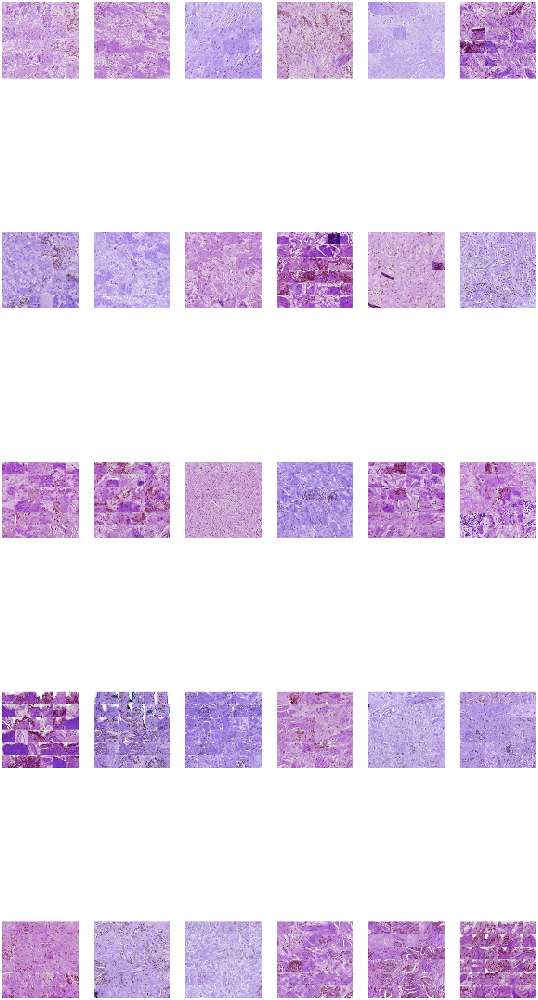

In [ ]:
names = [name[:-5] for name in os.listdir(TRAIN)]
Glued_images = "/content/drive/MyDrive/DLMI/purple_36_128/train"
plt.figure(figsize=(30,64))

for i in range(30):
    img = cv2.cvtColor(cv2.imread(os.path.join(Glued_images,names[i]+'.png')), cv2.COLOR_BGR2RGB)
    plt.subplot(5,6,i+1)
    plt.imshow(img)
    plt.axis('off')

As we can see, there are apparently no bad images. However, to make sure that all the images have a good proportion of purple, we need to examine all of them. 

In [ ]:
# Sanity check

image_path = "/content/drive/MyDrive/DLMI/purple_36_128/train"
ToReconstruct_L = []
for img_name in os.listdir(image_path) :
  image = cv2.cvtColor(cv2.imread(os.path.join(image_path,img_name)), cv2.COLOR_BGR2RGB)
  if is_purple(image,24,6)==False :
    ToReconstruct_L.append(img_name)

print(" The number of images that present a bad proportion of purple is ", 0)
  

 The number of images that present a bad proportion of purple is  0


For the pre-processing step, we also need to compute the mean and the standard deviation to standarize the images to help the model better generalize.

In [ ]:
def compute_statistics(df,path_load):
  L_mean=[]
  L_x2_mean=[]
  
  for index in range(len(df)) :
    row = df.iloc[index]
    img_id = row.image_id
    print(f"Currently on image {img_id}")
    img = cv2.cvtColor(cv2.imread(os.path.join(path_load,str(img_id)+'.png')), cv2.COLOR_BGR2RGB)
    L_mean.append((img/255.0).reshape(-1,3).mean(0))
    L_x2_mean.append(((img/255.0)**2).reshape(-1,3).mean(0))
  return L_mean,L_x2_mean

In [ ]:
L_mean,L_x2_mean =compute_statistics(df_train,image_path)
img_mean =  np.array(L_mean).mean(0)
img_std =  np.sqrt(np.array(L_x2_mean).mean(0) - img_mean**2)
print('mean:',img_mean, ', std:', np.sqrt(img_std))